In [1]:
import numpy as np
from scipy.fftpack import fftfreq

In [2]:
a = [0, 0.2, 0.4, 0.6, 0.8]
b = fftfreq(10, d=1/5)
c = fftfreq(len(a), d=1)

In [3]:
print(b)
print(c)

[ 0.   0.5  1.   1.5  2.  -2.5 -2.  -1.5 -1.  -0.5]
[ 0.   0.2  0.4 -0.4 -0.2]


In [4]:
a = 5
print(fftfreq(10, d=0.1))

[ 0.  1.  2.  3.  4. -5. -4. -3. -2. -1.]


In [19]:
from scipy.ndimage import median_filter, gaussian_filter

float32


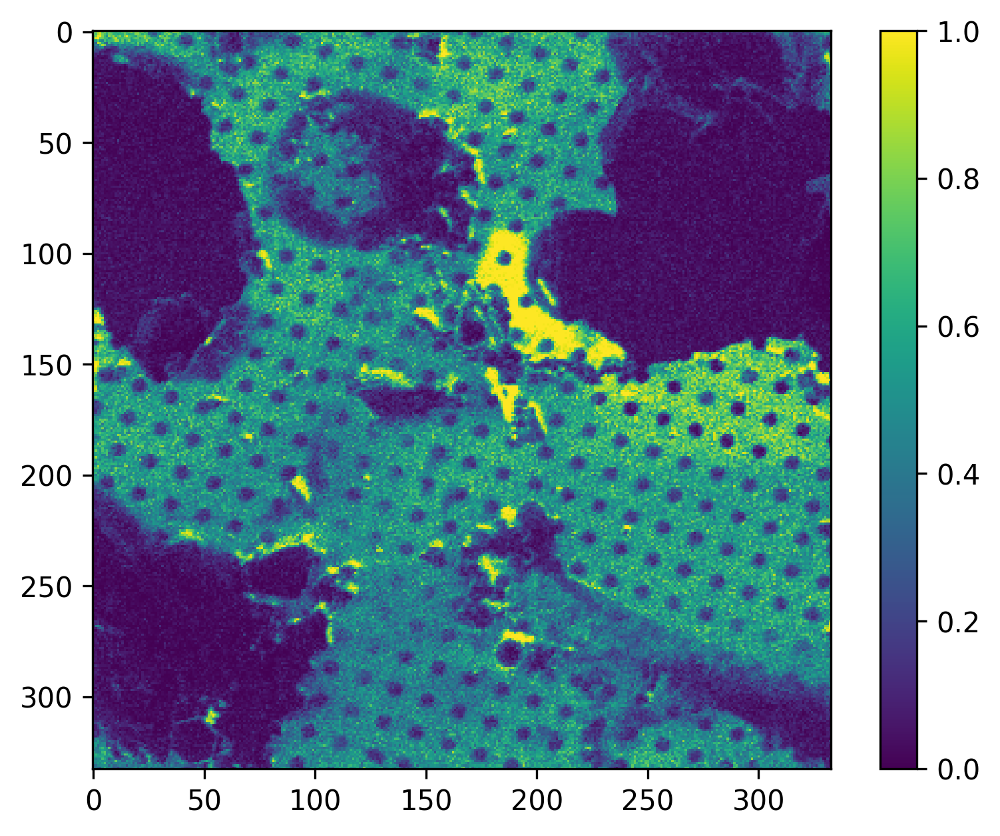

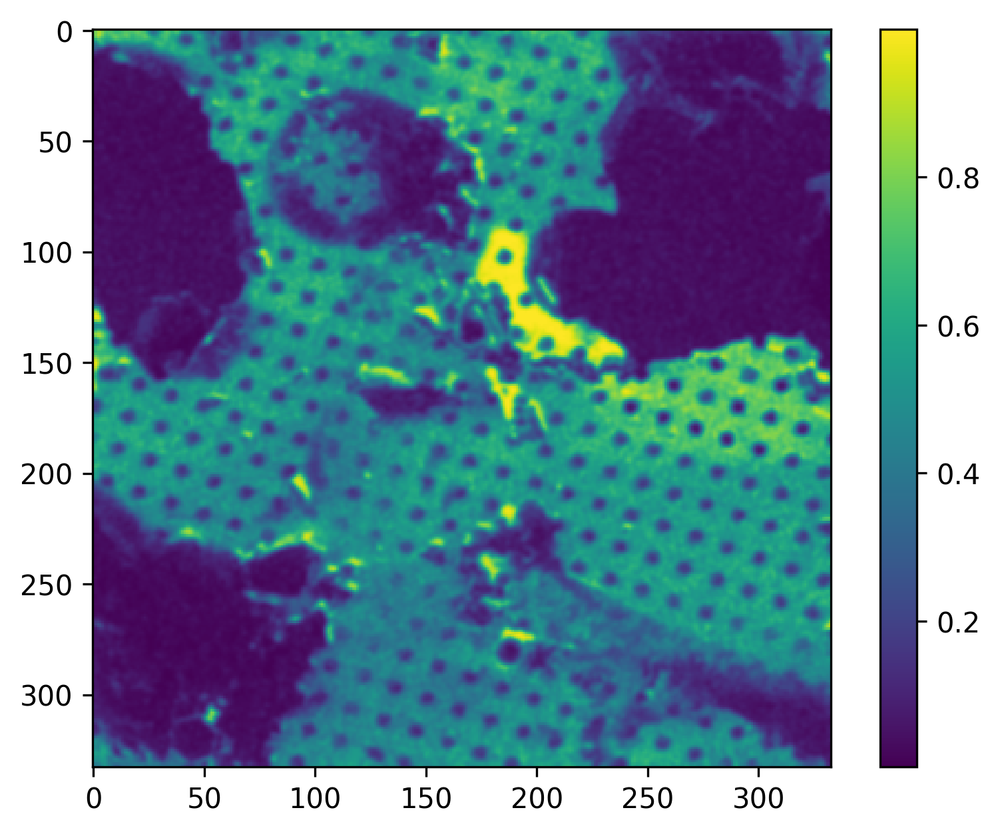

In [28]:
import numpy as np
import cv2
import tifffile as tf
import matplotlib.pyplot as plt

# Load the image
image = tf.imread(r'C:\Users\User\Github\openCLEM\scratch\IB_2000.tif')#.astype(np.float16)  # Read the image in grayscale
print(image.dtype)
plt.figure(dpi=300)
plt.imshow(image[0:image.shape[0]//6, 0:image.shape[1]//6])
plt.colorbar()
plt.show()

plt.figure(dpi=300)
plt.imshow(gaussian_filter(image[0:image.shape[0]//6, 0:image.shape[1]//6], 1))
plt.colorbar()
plt.show()


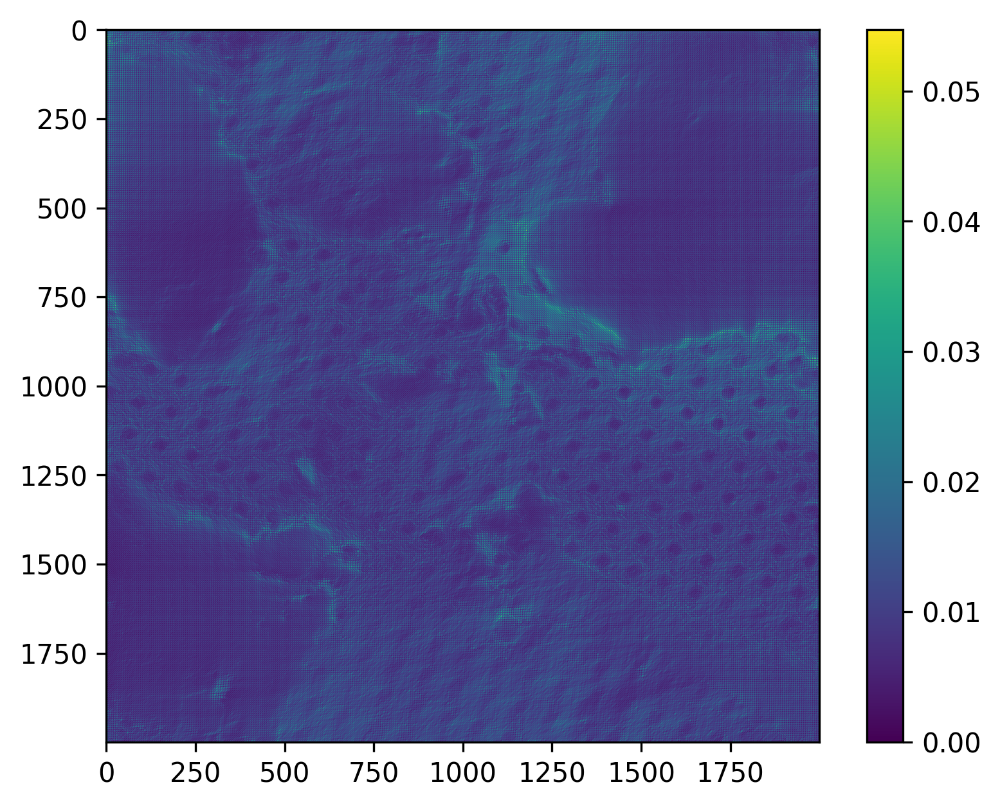

In [6]:

# Compute the 2D Fourier transform
fft = np.fft.fft2(image)
n=5
# Pad the Fourier transform
pad_rows = (n * image.shape[0])//2  # Double the number of rows
pad_cols = (n * image.shape[1])//2  # Double the number of columns
padded_fft = np.pad(fft, ((pad_rows, pad_rows), (pad_cols, pad_cols)), mode='constant', constant_values=0)

# Perform the inverse Fourier transform
padded_image = np.fft.ifft2(padded_fft)

# Take the magnitude of the complex result
padded_image = np.abs(padded_image)

# Convert the result to uint8 for visualization
# padded_image = np.uint8(padded_image)

# Display the original image and the padded image
# plt.imshow(image)
# plt.colorbar()
# plt.show()
plt.figure(dpi=300)
plt.imshow(padded_image[0:image.shape[0], 0:image.shape[1]])
plt.colorbar()
plt.show()
# plt.imshow(padded_image)
# plt.colorbar()

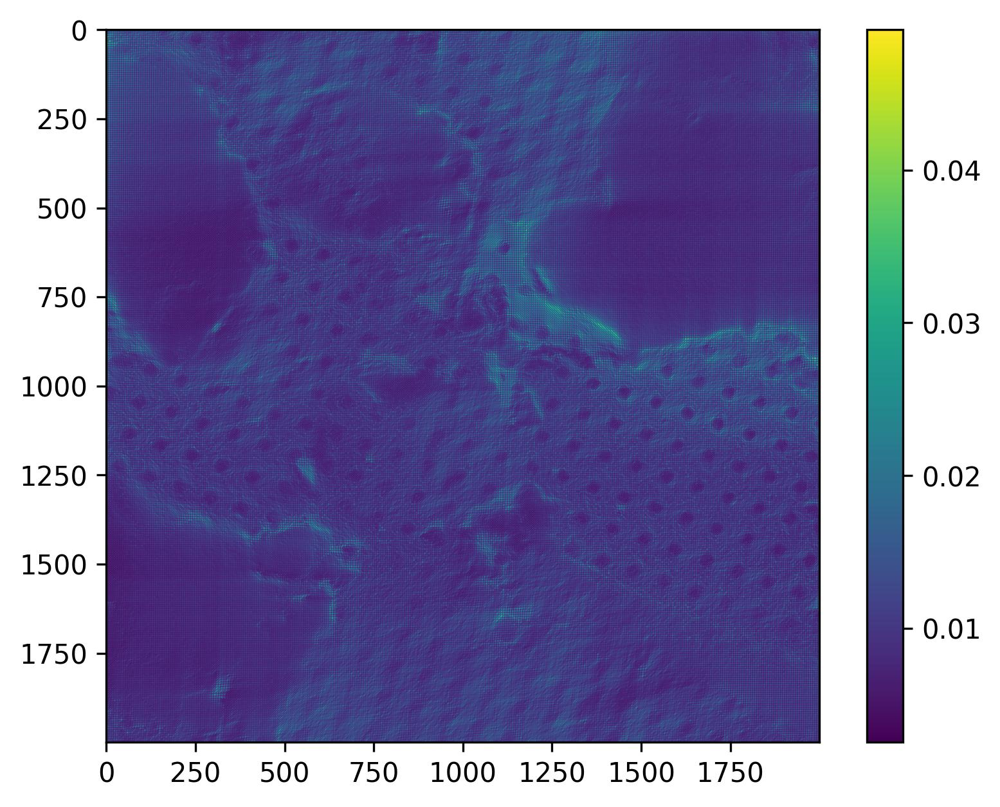

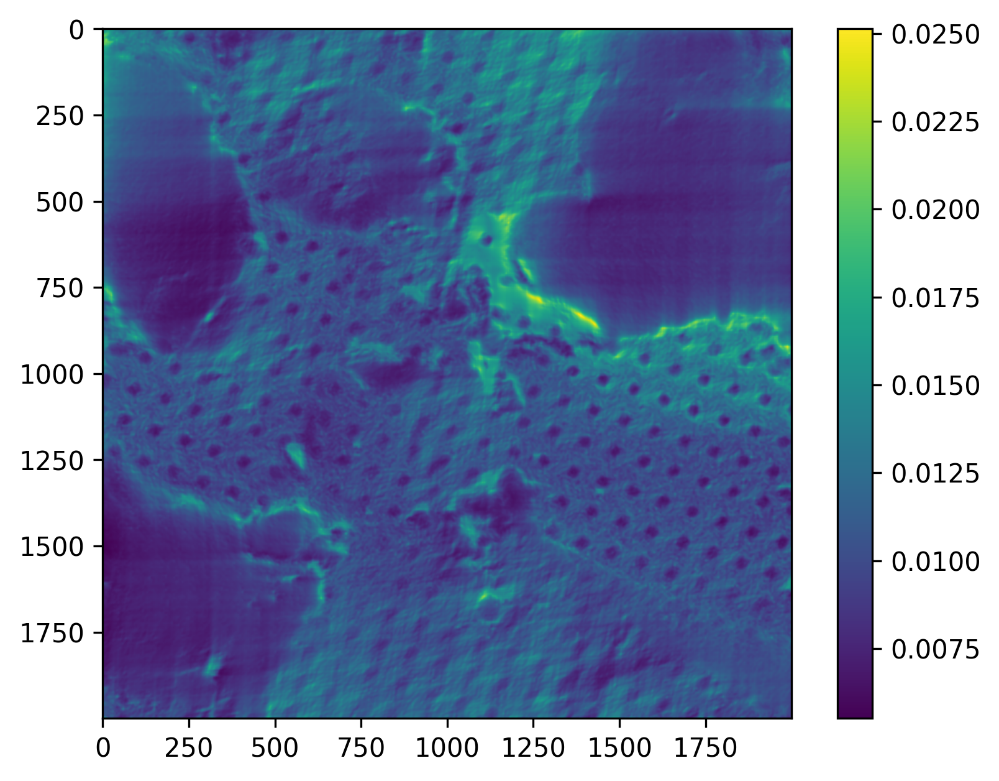

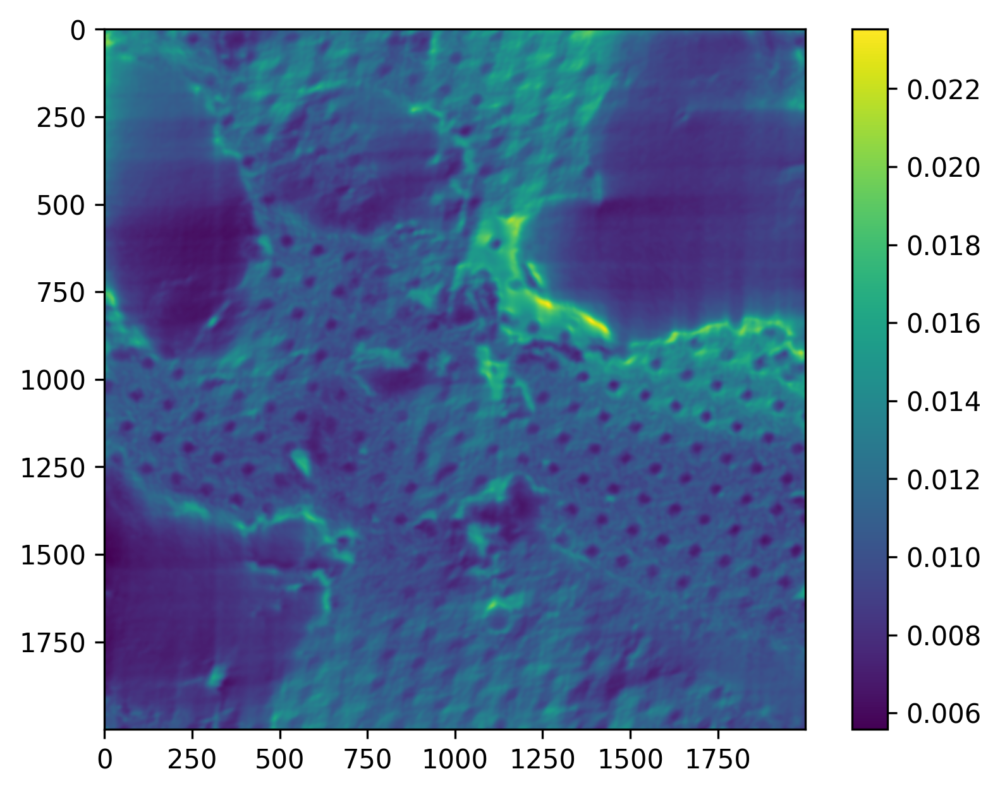

In [12]:

plt.figure(dpi=300)
plt.imshow(median_filter(padded_image[0:image.shape[0], 0:image.shape[1]], 3))
plt.colorbar()
plt.show()

plt.figure(dpi=300)
plt.imshow(gaussian_filter(padded_image[0:image.shape[0], 0:image.shape[1]], 3))
plt.colorbar()
plt.show()

plt.figure(dpi=300)
plt.imshow(gaussian_filter(padded_image[0:image.shape[0], 0:image.shape[1]], 5))
plt.colorbar()
plt.show()




In [7]:
print(padded_image.shape[0]/image.shape[0])

4.0


3072
2.604166666666667e-07


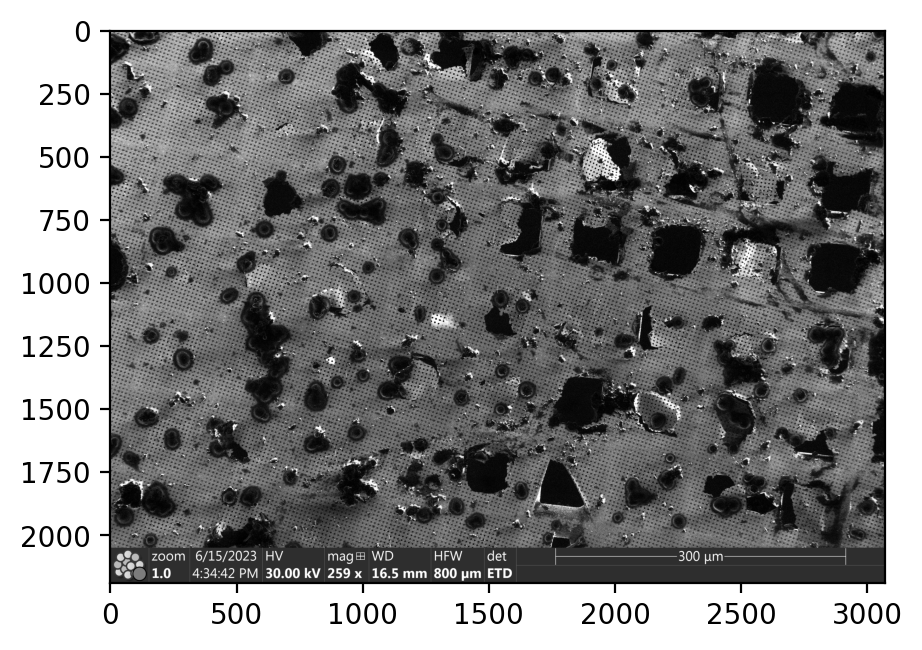

In [8]:
image = tf.imread(r"C:\Users\User\Documents\15-06-23 - Cells\ib_1__5.tif").astype(np.float32)
plt.figure(dpi=200, figsize=(5, 5))
plt.imshow(image, cmap='gray')
pixel_size = 800.e-6/image.shape[1]
print(image.shape[1])
print(pixel_size)

In [9]:
print(325e-9)

3.25e-07


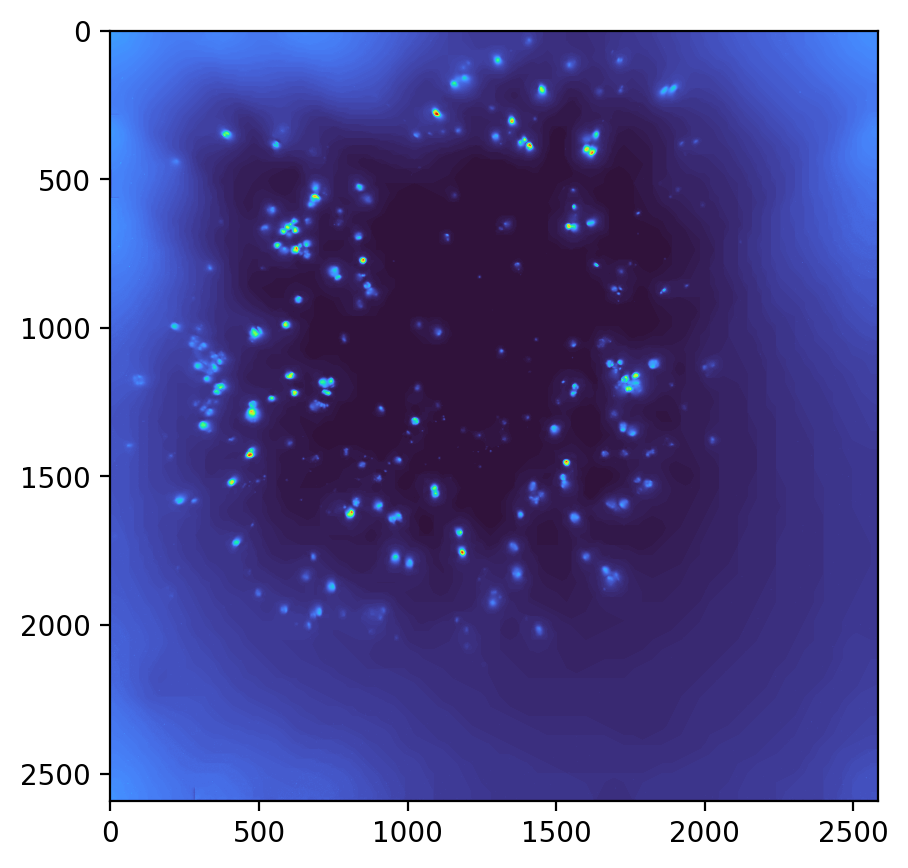

(2591, 2584)


In [10]:
image_1 = tf.imread(r'C:\Users\User\Github\openCLEM\scratch\stitched.tif')
plt.figure(dpi=200, figsize=(5,5))
plt.imshow(image_1, cmap='turbo')
plt.show()
print(image_1.shape)

In [11]:
pixel_size_lm = 325e-9
pixel_size_fib = 2.604166666666667e-07

In [25]:
realspace_lm = pixel_size_lm * image_1.shape[1]
realspace_fib = pixel_size_fib * image.shape[1]

In [26]:
print(realspace_lm)
print(realspace_fib)

0.0008398
0.0008


In [28]:
n_pixels = realspace_lm/pixel_size_fib
print(n_pixels)

3224.832


In [30]:
diff_lm = n_pixels - image_1.shape[1]
print(diff_lm)

640.8319999999999


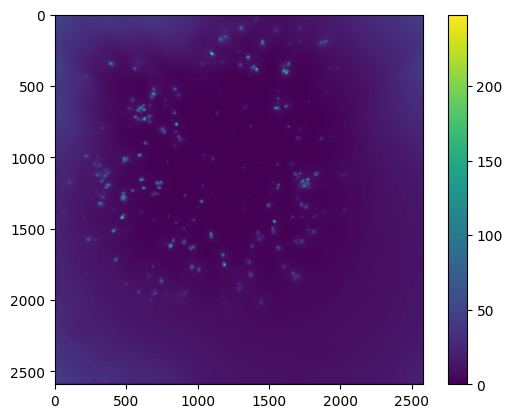

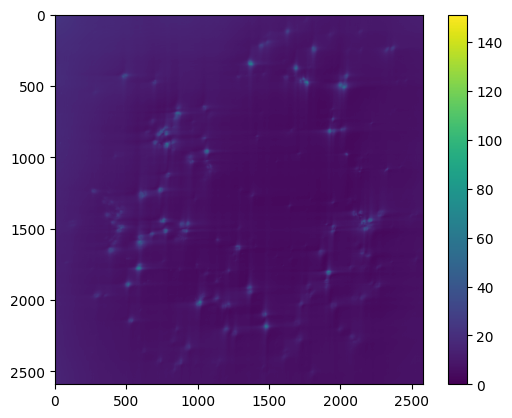

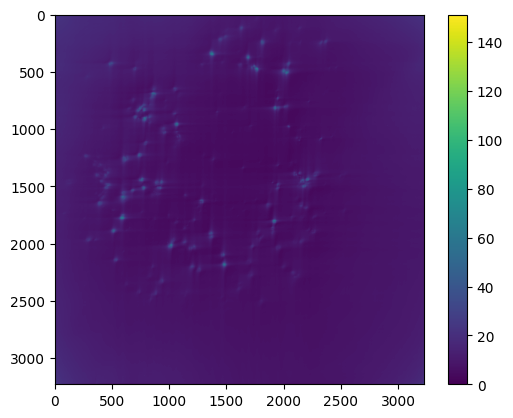

In [31]:

# Compute the 2D Fourier transform
fft = np.fft.fft2(image_1)
# Pad the Fourier transform
pad_rows = int(diff_lm/2)  # Double the number of rows
pad_cols = int(diff_lm/2)  # Double the number of columns
padded_fft = np.pad(fft, ((pad_rows, pad_rows), (pad_cols, pad_cols)), mode='constant', constant_values=0)

# Perform the inverse Fourier transform
padded_image = np.fft.ifft2(padded_fft)

# Take the magnitude of the complex result
padded_image = np.abs(padded_image)

# Convert the result to uint8 for visualization
# padded_image = np.uint8(padded_image)
""
# Display the original image and the padded image
plt.imshow(image_1)
plt.colorbar()
plt.show()
plt.imshow(padded_image[0:image_1.shape[0], 0:image_1.shape[1]])
plt.colorbar()
plt.show()
plt.imshow(padded_image)
plt.colorbar()

In [32]:
new_realspace_lm = padded_image.shape[1] * pixel_size_lm
new_pixel_size = realspace_lm / padded_image.shape[1]
print(new_realspace_lm)
print(realspace_lm)
print(realspace_fib)
print(new_pixel_size)

0.0010478
0.0008398
0.0008
2.6048387096774194e-07


In [33]:
print(pixel_size_fib)
print(pixel_size_lm)

2.604166666666667e-07
3.25e-07
